<h1 style="color:blue;"> Estimating the Delivery Time of an Order </h1>

# Business Problem:


One of India's Largest Marketplace for Intra-City Logistics strives to improve the lives of 1,50,000+ driver-partners by providing them with consistent earning & independence. Leader in the country's $40 billion intra-city logistics market, this company works with a wide range of restaurants for delivering their items directly to the people. They have a number of delivery partners available for delivering the food, from various restaurants. 

They want to build intelligence and capabilities using the data at hand to estimate the delivery time of an order that it can provide to the customers on the basis of what they are ordering, from where they are ordering, and also the delivery partners to avoid any shortcomings.

# Importing Libaries

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy import stats
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
%load_ext autoreload
%autoreload 2
from prettytable import PrettyTable
from tqdm import tqdm

from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn.metrics import f1_score, roc_auc_score, classification_report, roc_curve, precision_recall_curve
from sklearn.metrics import PrecisionRecallDisplay
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score
from sklearn.model_selection import RandomizedSearchCV
from sklearn.pipeline import Pipeline
from sklearn.metrics import roc_auc_score, confusion_matrix
from sklearn.metrics import roc_curve, auc


!pip install -q category_encoders
import category_encoders as ce

# Understanding the Data

## Quick Look at the data

__Loading the Data__

In [2]:
data_path = 'data.csv'
df = pd.read_csv(data_path)

__Data Dimension__

In [3]:
df.shape

(197428, 14)

__Summary:__

We have 197428 data points, and 14 features

__How the data looks like?__

In [4]:
pd.set_option('display.max_columns', None)
df.sample(5)

,market_id,created_at,actual_delivery_time,store_id,store_primary_category,order_protocol,total_items,subtotal,num_distinct_items,min_item_price,max_item_price,total_onshift_partners,total_busy_partners,total_outstanding_orders
84642,4.0,2015-02-05 03:59:40,2015-02-05 05:17:32,d6baf65e0b240ce177cf70da146c8dc8,vietnamese,2.0,3,2925,2,975,975,65.0,67.0,145.0
49603,6.0,2015-01-21 23:33:50,2015-01-22 00:04:16,33d6548e48d4318ceb0e3916a79afc84,burger,4.0,4,2025,3,325,700,NaN,NaN,NaN
10933,6.0,2015-02-13 18:54:08,2015-02-13 19:48:49,4e477793df9bdde030226dcd3a262a4a,sandwich,1.0,3,3194,3,975,994,NaN,NaN,NaN
64337,1.0,2015-02-12 19:57:25,2015-02-12 20:43:04,cb03474483e366b5c8dd9f4a2a7537c1,mexican,3.0,5,2565,3,295,865,27.0,28.0,34.0
25343,3.0,2015-02-18 01:21:57,2015-02-18 02:13:53,2722551363e0df6fe8dd2f3933642d78,chinese,1.0,10,12300,10,975,1375,5.0,3.0,2.0


__Findings__
- Each row in the data corresponds to one unique delivery

__Column names:__

In [5]:
df.columns

Index(['market_id', 'created_at', 'actual_delivery_time', 'store_id',
       'store_primary_category', 'order_protocol', 'total_items', 'subtotal',
       'num_distinct_items', 'min_item_price', 'max_item_price',
       'total_onshift_partners', 'total_busy_partners',
       'total_outstanding_orders'],
      dtype='object')

**We have following informations about the columns:**
<ol>
<li>market_id : integer id for the market where the restaurant lies</li>
<li>created_at : the timestamp at which the order was placed</li>
<li>actual_delivery_time : the timestamp when the order was delivered</li>
<li>store_id : unique id of the restaurant where order is placed</li>
<li>store_primary_category : category for the restaurant</li>
<li>order_protocol : integer code value for order protocol (how the order was placed ie: through the company, call to restaurant, pre booked, third part etc)</li>
<li>total_items : number of items in the order</li>
<li>subtotal : final price of the order</li>
<li>num_distinct_items : the number of distinct items in the order</li>
<li>min_item_price : price of the cheapest item in the order</li>
<li>max_item_price : price of the costliest item in order</li>
<li>total_onshift_partners : number of delivery partners on duty at the time order was placed</li>
<li>total_busy_partners : number of delivery partners attending to other tasks</li>
<li>total_outstanding_orders : total number of orders to be fulfilled at the moment</li>
</ol>

__Checking the data types of the columns__

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 197428 entries, 0 to 197427
Data columns (total 14 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   market_id                 196441 non-null  float64
 1   created_at                197428 non-null  object 
 2   actual_delivery_time      197421 non-null  object 
 3   store_id                  197428 non-null  object 
 4   store_primary_category    192668 non-null  object 
 5   order_protocol            196433 non-null  float64
 6   total_items               197428 non-null  int64  
 7   subtotal                  197428 non-null  int64  
 8   num_distinct_items        197428 non-null  int64  
 9   min_item_price            197428 non-null  int64  
 10  max_item_price            197428 non-null  int64  
 11  total_onshift_partners    181166 non-null  float64
 12  total_busy_partners       181166 non-null  float64
 13  total_outstanding_orders  181166 non-null  f

__Summary__

- We have following types of attributes: `float`, `int`, and `object`

## Some basic checks


### Checking duplicate rows

In [12]:
duplicate = df[df.duplicated(keep = 'last')]
duplicate

,market_id,created_at,actual_delivery_time,store_id,store_primary_category,order_protocol,total_items,subtotal,num_distinct_items,min_item_price,max_item_price,total_onshift_partners,total_busy_partners,total_outstanding_orders


__Findings:__
- There are no duplicate rows in the dataset

### Fixing any discrepansies in dtype

In [13]:
def iqr(x):
    return x.quantile(q=0.75) - x.quantile(q=0.25)

def quantile_boundaries(x):
    upper_out = x.quantile(q=0.75) + 1.5 * iqr(x)
    lower_out = x.quantile(q=0.25) - 1.5 * iqr(x)
    return (lower_out, upper_out)

## Outlier > 75th %tile + 1.5IQR & < 25th %tile - 1.5IQR
def outlier_count(x):
    upper_out = x.quantile(q=0.75) + 1.5 * iqr(x)
    lower_out = x.quantile(q=0.25) - 1.5 * iqr(x)

    return len(x[x > upper_out]) + len(x[x < lower_out])

In [14]:
def stats_summary(df, type):
    """
    Method to display statistical summaries for categorical and numerical columns

    Arguments:
        df: a data frame object
        type: the dtype for which summaries will be computed.
            Accepts two values: either 'numeric' or 'category'

    Returns:
        A dataframe object containing statistical summaries
    """
    if type=='numeric':
        df_num = df._get_numeric_data()
        df_stats = df_num.describe().T
        try:
            vals = []
            unique = []
            for c in df_num.columns:
                vals.append(outlier_count(df_num[c]))
                unique.append(df_num[c].nunique())
            df_stats['Count of Outliers'] = vals
            df_stats['Unique Values'] = unique
        except:
            pass
        return df_stats

    elif type=='category':
        df_cat = df.select_dtypes(['category'])
        df_stats = df_cat.describe().T

        try:
            vals = []
            for c in df_cat.columns:
                vals.append((df_cat[df_cat[c].isnull()].shape[0]*100) / df_cat.shape[0])
            df_stats['Missing Percentage'] = vals
        except:
            pass
        return df_stats

    else:
        raise Exception('Legal type params are {"numeric", "category"}') 

In [15]:
def datatype_conversion(df, columns, target_type):
    """
    Method to convert the type of columns in "columns" to "target_type"
    """
    convert_dict = dict(zip(columns, [target_type]*len(columns)))
    df = df.astype(convert_dict)
    return df

def datatype_information(df):
    """
    Method to display "dtype" for each column
    """
    datatype_info = pd.DataFrame(columns=df.columns)
    for col in df.columns:
        datatype_info.loc[0, col] = df[col].dtype
    return datatype_info

#### numbers

In [16]:
df.select_dtypes([np.number]).head()

,market_id,order_protocol,total_items,subtotal,num_distinct_items,min_item_price,max_item_price,total_onshift_partners,total_busy_partners,total_outstanding_orders
0,1.0,1.0,4,3441,4,557,1239,33.0,14.0,21.0
1,2.0,2.0,1,1900,1,1400,1400,1.0,2.0,2.0
2,3.0,1.0,1,1900,1,1900,1900,1.0,0.0,0.0
3,3.0,1.0,6,6900,5,600,1800,1.0,1.0,2.0
4,3.0,1.0,3,3900,3,1100,1600,6.0,6.0,9.0


In [17]:
stats_summary(df, 'numeric')

,count,mean,std,min,25%,50%,75%,max,Count of Outliers,Unique Values
market_id,196441.0,2.978706,1.524867,1.0,2.0,3.0,4.0,6.0,0,6
order_protocol,196433.0,2.882352,1.503771,1.0,1.0,3.0,4.0,7.0,0,7
total_items,197428.0,3.196391,2.666546,1.0,2.0,3.0,4.0,411.0,9588,57
subtotal,197428.0,2682.331402,1823.093688,0.0,1400.0,2200.0,3395.0,27100.0,9054,8368
num_distinct_items,197428.0,2.670791,1.630255,1.0,1.0,2.0,3.0,20.0,5919,20
min_item_price,197428.0,686.218470,522.038648,-86.0,299.0,595.0,949.0,14700.0,4600,2312
max_item_price,197428.0,1159.588630,558.411377,0.0,800.0,1095.0,1395.0,14700.0,7729,2652
total_onshift_partners,181166.0,44.808093,34.526783,-4.0,17.0,37.0,65.0,171.0,1502,172
total_busy_partners,181166.0,41.739747,32.145733,-5.0,15.0,34.0,62.0,154.0,606,159
total_outstanding_orders,181166.0,58.050065,52.661830,-6.0,17.0,41.0,85.0,285.0,5301,281


__Findings:__
- The number of unique values for the attribute "market_id", and "order_protocol" is small. We can treat them as categorical.
- There are outliers in most of the features. We will have to figure out a way to deal with them.

#### object

In [18]:
df.select_dtypes('object').head(3)

,created_at,actual_delivery_time,store_id,store_primary_category
0,2015-02-06 22:24:17,2015-02-06 23:27:16,df263d996281d984952c07998dc54358,american
1,2015-02-10 21:49:25,2015-02-10 22:56:29,f0ade77b43923b38237db569b016ba25,mexican
2,2015-01-22 20:39:28,2015-01-22 21:09:09,f0ade77b43923b38237db569b016ba25,NaN


In [19]:
df.describe(include='object')

,created_at,actual_delivery_time,store_id,store_primary_category
count,197428,197421,197428,192668
unique,180985,178110,6743,74
top,2015-02-11 19:50:43,2015-02-11 20:40:45,d43ab110ab2489d6b9b2caa394bf920f,american
freq,6,5,937,19399


__Findings:__
- "created_at" and "actual_delivery_time" are timestamp attributes. We will fix their dtype and treat them accordingly
- "store_primary_category" is a categorical attribute. 

#### Fixing the dtype

In [20]:
df = datatype_conversion(df, ["market_id", "order_protocol", "store_primary_category"], 'category')
df = datatype_conversion(df, ["created_at", "actual_delivery_time" ], 'datetime64')

In [21]:
datatype_information(df)

,market_id,created_at,actual_delivery_time,store_id,store_primary_category,order_protocol,total_items,subtotal,num_distinct_items,min_item_price,max_item_price,total_onshift_partners,total_busy_partners,total_outstanding_orders
0,category,datetime64[ns],datetime64[ns],object,category,category,int64,int64,int64,int64,int64,float64,float64,float64


__Summary__

- We fixed the incorrect datatypes

### Checking missing values

In [22]:
def missing_val_overview(df):

    ## Creating Empty Data Frame
    data_info = pd.DataFrame(np.random.randn(0, 5) * 0,
                             columns=['No. of Rows with missing values',
                                      'No. of columns with zero missing cases',
                                      'No. of columns with >0 and <=50% missing cases',
                                      'No. of columns with >50% missing cases',
                                      'No. of columns with >90% missing cases'])

    ## Data Inofrmation
    data_info.loc[0, 'No. of Rows with missing values'] = df.isna().any(axis=1).sum()
    null_per = pd.DataFrame(df.isna().sum()/df.shape[0])
    null_per.columns = ['null_per']
    data_info.loc[0, 'No. of columns with zero missing cases']  = null_per[null_per.null_per == 0.0].shape[0] 
    data_info.loc[0, 'No. of columns with >0 and <=50% missing cases'] = null_per[(null_per.null_per <= 0.50) & (null_per.null_per > 0)].shape[0] 
    data_info.loc[0, 'No. of columns with >50% missing cases']  = null_per[null_per.null_per > 0.50].shape[0]
    data_info.loc[0, 'No. of columns with >90% missing cases']  = null_per[null_per.null_per > 0.90].shape[0]
    
    ## Transposing Data to get in consumable format
    data_info = data_info.transpose()
    data_info.columns = ['Value']
    data_info['Value'] = data_info['Value'].astype(int)

    return data_info

In [23]:
missing_val_overview(df)

,Value
No. of Rows with missing values,21180
No. of columns with zero missing cases,7
No. of columns with >0 and <=50% missing cases,7
No. of columns with >50% missing cases,0
No. of columns with >90% missing cases,0


**Summary**
- There are missing values in 7 columns

In [24]:
df.isnull().sum() / df.shape[0] * 100

market_id                   0.499929
created_at                  0.000000
actual_delivery_time        0.003546
store_id                    0.000000
store_primary_category      2.411006
order_protocol              0.503981
total_items                 0.000000
subtotal                    0.000000
num_distinct_items          0.000000
min_item_price              0.000000
max_item_price              0.000000
total_onshift_partners      8.236927
total_busy_partners         8.236927
total_outstanding_orders    8.236927
dtype: float64

__Findings:__
- There is missing values for numerical, categorical, and as well as object columns.
- We will employ different strategies to impute/clean them.

# EDA

We did some surface scratching and found some basic details. Now we will go in depth exploration of the dataset and try to come up with some possible actionable insights.

## Univariate Analysis

In [7]:
def make_categorical_plots(df, feature, rotation=70):
    """
    Method to make univariate categorical plot
    """

    # creating a figure composed of two matplotlib.Axes objects (ax_count and ax_pie)
    f, (ax_count, ax_pie) = plt.subplots(nrows=1, ncols=2, figsize=(15,7))
    f.suptitle(f'Distribution of {feature}', fontsize=15)

    # assigning a graph to each ax
    data = df[feature].value_counts()

    sns.countplot(data=df, x=feature, order=data.index, ax=ax_count)
    if len(data) > 8:
        ax_count.set_xticklabels(labels=data.index, rotation=rotation)

    for p in ax_count.patches:
        x=p.get_bbox().get_points()[:,0]
        y=p.get_bbox().get_points()[1,1]
        ax_count.annotate('{}'.format(int(y)), (x.mean(), y), 
                ha='center', va='bottom')

    #customize plot
    params = {
        'autopct':'%.0f%%',
        'startangle': 90,
        'radius': 1,
        'wedgeprops': {'linewidth': 3},
        'explode': (0.01,)*df[feature].nunique(),
        'textprops': {'size': 'large'}
    }
    #create pie chart
    ax_pie.pie(data.values, labels = data.index, **params)
    plt.show()

### Statistical Summary:

In [8]:
def stats_summary(df, type):
    """
    Method to display statistical summaries for categorical and numerical columns

    Arguments:
        df: a data frame object
        type: the dtype for which summaries will be computed.
            Accepts two values: either 'numeric' or 'category'

    Returns:
        A dataframe object containing statistical summaries
    """
    if type=='numeric':
        df_num = df._get_numeric_data()
        df_stats = df_num.describe().T
        try:
            vals = []
            miss = []
            for c in df_num.columns:
                vals.append(outlier_count(df_num[c]))
                miss.append(df_num[c].isnull().sum() / df_num.shape[0] * 100)
            df_stats['Count of Outliers'] = vals
            df_stats['% of Missing Values'] = miss
        except:
            pass
        return df_stats

    elif type=='category':
        df_cat = df.select_dtypes(['category'])
        df_stats = df_cat.describe().T

        try:
            vals = []
            for c in df_cat.columns:
                vals.append((df_cat[df_cat[c].isnull()].shape[0]*100) / df_cat.shape[0])
            df_stats['% of Missing Values'] = vals
        except:
            pass
        return df_stats

    else:
        raise Exception('Legal type params are {"numeric", "category"}') 

#### Numerical Stats

In [9]:
stats_summary(df, 'numeric')

,count,mean,std,min,25%,50%,75%,max
market_id,196441.0,2.978706,1.524867,1.0,2.0,3.0,4.0,6.0
order_protocol,196433.0,2.882352,1.503771,1.0,1.0,3.0,4.0,7.0
total_items,197428.0,3.196391,2.666546,1.0,2.0,3.0,4.0,411.0
subtotal,197428.0,2682.331402,1823.093688,0.0,1400.0,2200.0,3395.0,27100.0
num_distinct_items,197428.0,2.670791,1.630255,1.0,1.0,2.0,3.0,20.0
min_item_price,197428.0,686.218470,522.038648,-86.0,299.0,595.0,949.0,14700.0
max_item_price,197428.0,1159.588630,558.411377,0.0,800.0,1095.0,1395.0,14700.0
total_onshift_partners,181166.0,44.808093,34.526783,-4.0,17.0,37.0,65.0,171.0
total_busy_partners,181166.0,41.739747,32.145733,-5.0,15.0,34.0,62.0,154.0
total_outstanding_orders,181166.0,58.050065,52.661830,-6.0,17.0,41.0,85.0,285.0


__Observation__:
- There are outliers in allmost all the numerical columns. We will try to make sense of the outliers in our further analysis
- There are missing values in "total_onshift_partners", "total_busy_partners", and "total_outstanding_orders". One thing to note is that, the missing values seem to appear together for these 3 attributes.

**Note:** The outliers are the data points lying outside the range `[25th %tile - 1.5IQR, 75th %tile + 1.5IQR]`

The fence values are computed as illustrated in the image below:

![](http://www.nathalievialaneix.eu/teaching/biostat1/img/boxplot_explanation.png)

#### Categorical Count Stats

In [25]:
stats_summary(df, 'category')

,count,unique,top,freq,Missing Percentage
market_id,196441.0,6.0,2.0,55058.0,0.499929
store_primary_category,192668,74,american,19399,2.411006
order_protocol,196433.0,7.0,1.0,54725.0,0.503981


__Observation:__
- There are missing values in the data

### Categorical Attributes

#### market_id

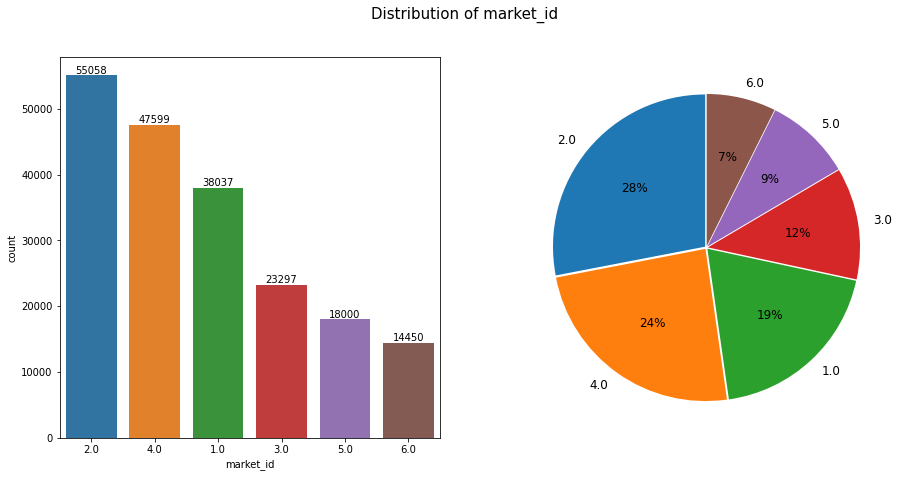

In [26]:
make_categorical_plots(df, 'market_id')

__Findings:__
- We have data for 6 markets
- The company is highly active in market "2", followed by "4". It is least active in market "6"

#### store_primary_category

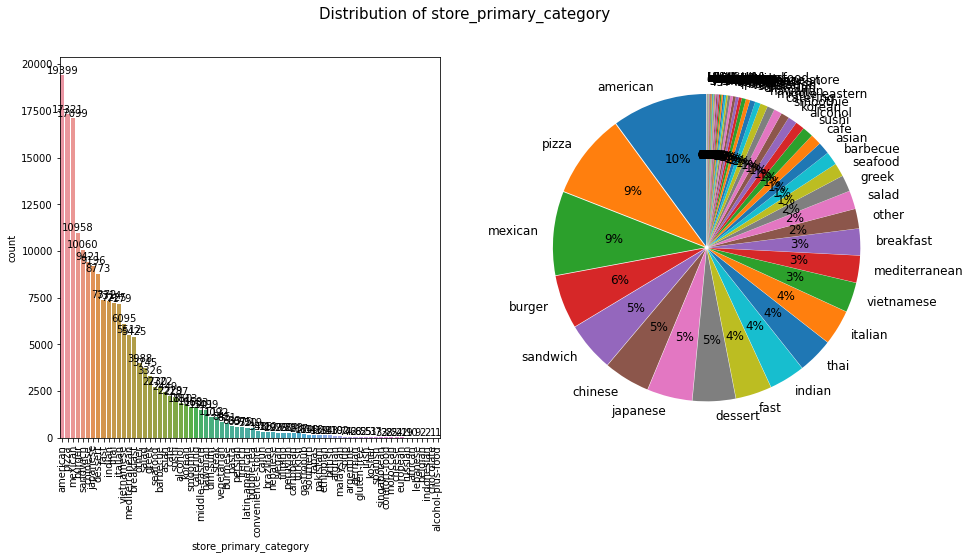

In [27]:
make_categorical_plots(df, 'store_primary_category', 90)

In [28]:
df['store_primary_category'].nunique()

74

In [29]:
df['store_primary_category'].value_counts(normalize=True)*100

american             10.068615
pizza                 8.990076
mexican               8.874852
burger                5.687504
sandwich              5.221417
                       ...    
lebanese              0.004671
belgian               0.001038
indonesian            0.001038
chocolate             0.000519
alcohol-plus-food     0.000519
Name: store_primary_category, Length: 74, dtype: float64

__Findings:__
- The company caters to 74 different categories of stores/restaurants
- Most of the delivery orders comes "american", "pizza", and "mexican" restaurants.
- The least deliery orders comes from "indonesian", "chocolate", and "alcohol-plus-food" restaurants.

#### order_protocol

- integer code value for order protocol (how the order was placed ie: through the company, call to restaurant, pre booked, third part etc)

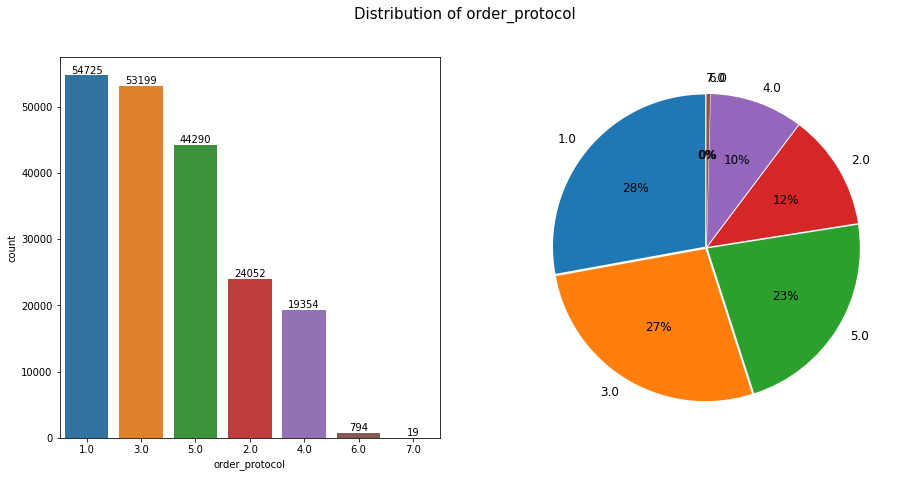

In [30]:
make_categorical_plots(df, 'order_protocol')

__Findings:__
- This company's services can availed using 7 different modes
- Most of the orders are placed through channels 1, 3, and 5 (accounting for ~80% of the business)
- Least number of orders comes from the channels 6, and 7

### Numerical Attributes

In [31]:
def make_numerical_plots(df, feature, bins='auto'):
    """
    Method to make univariate numerical plot
    """
    # creating a figure composed of two matplotlib.Axes objects (ax_box and ax_hist)
    f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)}, figsize=(15,7))
    f.suptitle(f'Distribution of {feature}', fontsize=15)

    # assigning a graph to each ax
    sns.boxplot(df[feature], ax=ax_box)
    sns.histplot(data=df, x=feature, ax=ax_hist, kde=True, bins=bins)

    # Remove x axis name for the boxplot
    ax_box.set(xlabel='')
    plt.show()

def bi_cat_plot(df, x, target="loan_status"):
    plt.figure(figsize=(15, 7))
    sns.boxplot(data=df, x=x, y=target)
    plt.title(f'Plot for {x} vs {target}', fontsize=15)
    plt.show()

#### total_items

In [32]:
df['total_items'].describe()

count    197428.000000
mean          3.196391
std           2.666546
min           1.000000
25%           2.000000
50%           3.000000
75%           4.000000
max         411.000000
Name: total_items, dtype: float64

__Findings:__
- Total items in an order ranges from 1 to 411
- The average number of items in an order is 3. The median value is 3.

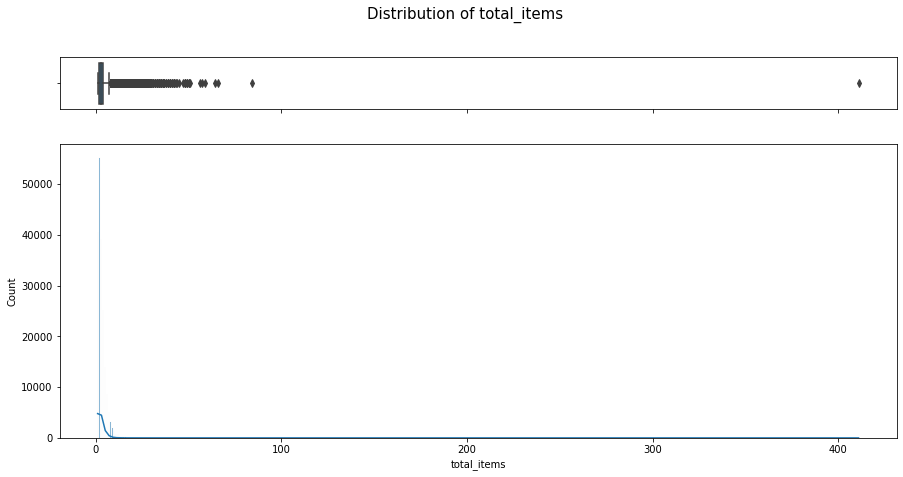

In [33]:
make_numerical_plots(df, 'total_items')

In [34]:
print(f'The values lying ouside of {quantile_boundaries(df["total_items"])} are considered outliers')
print(f'There are {outlier_count(df["total_items"])} outlier data points')

The values lying ouside of (-1.0, 7.0) are considered outliers
There are 9588 outlier data points


__Findings:__
- There are lot of outliers in the distribution.

#### subtotal

In [35]:
df['subtotal'].describe()

count    197428.000000
mean       2682.331402
std        1823.093688
min           0.000000
25%        1400.000000
50%        2200.000000
75%        3395.000000
max       27100.000000
Name: subtotal, dtype: float64

__Findings:__
- The price of an order ranges from 0 to 27100.
- The mean price for an order is 2682, and the median price is 2200.

**Orders with `subtotal = 0`**

In [36]:
df[df['subtotal'] == 0].sample(5)

,market_id,created_at,actual_delivery_time,store_id,store_primary_category,order_protocol,total_items,subtotal,num_distinct_items,min_item_price,max_item_price,total_onshift_partners,total_busy_partners,total_outstanding_orders
181508,4.0,2015-02-10 21:51:13,2015-02-10 22:32:37,d30960ce77e83d896503d43ba249caf7,sandwich,3.0,2,0,2,649,799,28.0,20.0,23.0
48029,1.0,2015-01-22 04:59:43,2015-01-22 05:30:23,f2c3b258e9cd8ba16e18f319b3c88c66,burger,1.0,4,0,3,299,429,19.0,17.0,16.0
115731,4.0,2015-02-16 02:22:19,2015-02-16 03:31:33,34173cb38f07f89ddbebc2ac9128303f,thai,3.0,2,0,2,200,999,80.0,77.0,137.0
121244,2.0,2015-01-30 00:59:07,2015-01-30 01:39:19,320722549d1751cf3f247855f937b982,steak,2.0,2,0,2,995,1495,36.0,35.0,42.0
18616,1.0,2015-02-14 02:34:13,2015-02-14 04:07:53,a563b6d5abbf137175059d6bb14672cc,pizza,1.0,4,0,4,399,1099,7.0,7.0,9.0


__Findings__
- These entries with `subtotal = 0` seems noisy. We will remove them later.

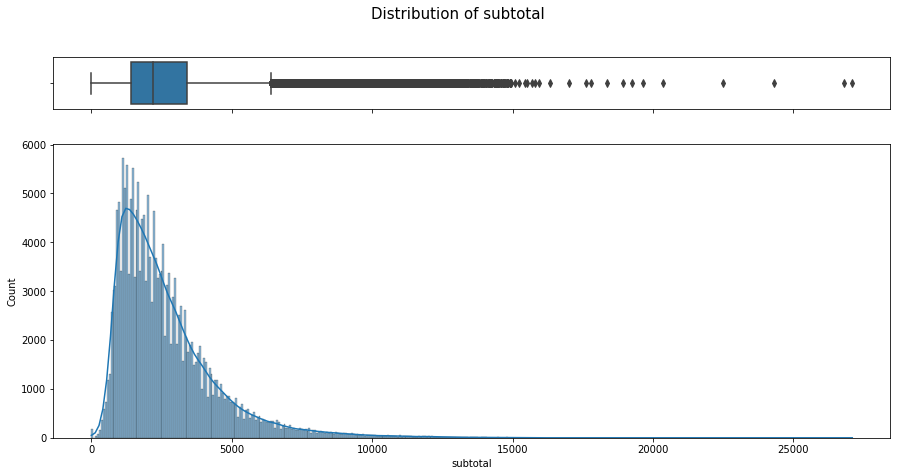

In [37]:
make_numerical_plots(df, 'subtotal')

In [38]:
print(f'The values lying ouside of {quantile_boundaries(df["subtotal"])} are considered outliers')
print(f'There are {outlier_count(df["subtotal"])} outlier data points')

The values lying ouside of (-1592.5, 6387.5) are considered outliers
There are 9054 outlier data points


__Findings:__
- The distribution is right skewed
- There are many outliers in the data.

#### num_distinct_items

In [39]:
df['num_distinct_items'].describe()

count    197428.000000
mean          2.670791
std           1.630255
min           1.000000
25%           1.000000
50%           2.000000
75%           3.000000
max          20.000000
Name: num_distinct_items, dtype: float64

__Findings:__
- Number of distinct items in an order ranges from 1 to 20
- On an average, an order has ~3 different items. Median value is 2.

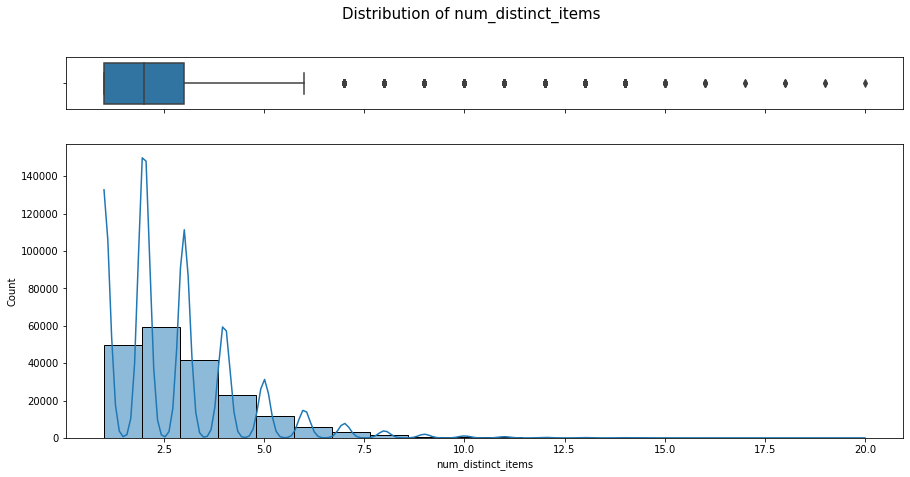

In [40]:
make_numerical_plots(df, 'num_distinct_items', bins=20)

In [41]:
print(f'The values lying ouside of {quantile_boundaries(df["num_distinct_items"])} are considered outliers')
print(f'There are {outlier_count(df["num_distinct_items"])} outlier data points')

The values lying ouside of (-2.0, 6.0) are considered outliers
There are 5919 outlier data points


__Findings:__
- There are outliers in the data. 

#### min_item_price

In [42]:
df['min_item_price'].describe()

count    197428.000000
mean        686.218470
std         522.038648
min         -86.000000
25%         299.000000
50%         595.000000
75%         949.000000
max       14700.000000
Name: min_item_price, dtype: float64

__Findings:__
- The price of the cheapest item in an order ranges from -86 to 14700 
- On an average, the cheapest price is 686. Median cheapest price 595 .

**Orders with negative price**

In [43]:
df[df['min_item_price'] < 0].sample(3)

,market_id,created_at,actual_delivery_time,store_id,store_primary_category,order_protocol,total_items,subtotal,num_distinct_items,min_item_price,max_item_price,total_onshift_partners,total_busy_partners,total_outstanding_orders
790,1.0,2015-01-29 02:59:28,2015-01-29 03:44:09,c56a4706337730e0e15da875405fa1c5,fast,4.0,3,1003,3,-86,1066,24.0,29.0,38.0
187278,2.0,2015-02-04 16:56:44,2015-02-04 17:34:10,3ba889650589407203d06949bdf6983d,fast,4.0,16,2162,5,-52,397,15.0,13.0,15.0
77238,5.0,2015-02-14 22:01:48,2015-02-14 23:15:15,648f4baa45889f9c5f4f7add35862841,pizza,3.0,1,3099,1,-31,52,22.0,26.0,34.0


__Findings__
- Price of an item having negative value does not makes sense. We will have to remove these rows from the data.

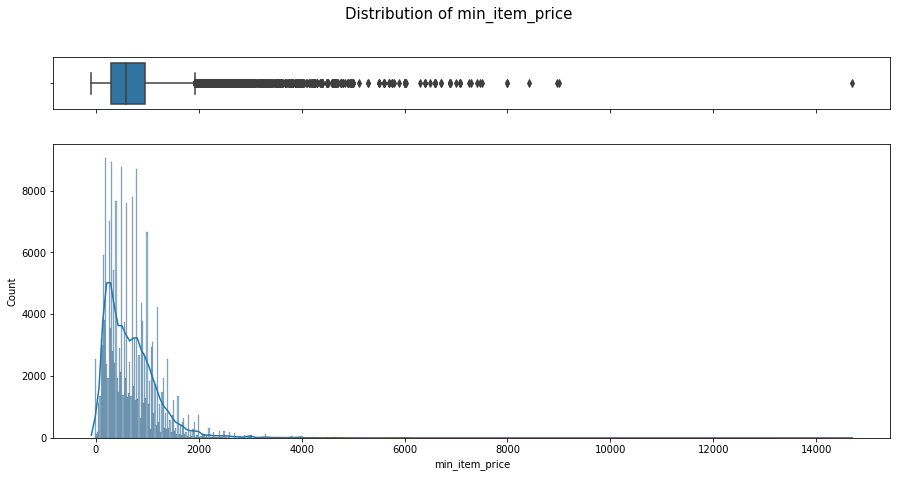

In [44]:
make_numerical_plots(df, 'min_item_price')

In [45]:
print(f'The values lying ouside of {quantile_boundaries(df["min_item_price"])} are considered outliers')
print(f'There are {outlier_count(df["min_item_price"])} outlier data points')

The values lying ouside of (-676.0, 1924.0) are considered outliers
There are 4600 outlier data points


__Findings:__
- There are outliers in the data. 

#### max_item_price

In [46]:
df['max_item_price'].describe()

count    197428.000000
mean       1159.588630
std         558.411377
min           0.000000
25%         800.000000
50%        1095.000000
75%        1395.000000
max       14700.000000
Name: max_item_price, dtype: float64

__Findings:__
- The price of the costliest item in an order ranges from 0 to 14700 
- On an average, the costliest item price is 1159. Median price of the costliest item is 1095. .

**Orders with 0 price**

In [47]:
df[df['max_item_price'] == 0].sample(3)

,market_id,created_at,actual_delivery_time,store_id,store_primary_category,order_protocol,total_items,subtotal,num_distinct_items,min_item_price,max_item_price,total_onshift_partners,total_busy_partners,total_outstanding_orders
78076,5.0,2015-01-27 02:26:45,2015-01-27 02:56:56,648f4baa45889f9c5f4f7add35862841,pizza,3.0,1,2418,1,0,0,43.0,41.0,36.0
20227,1.0,2015-01-21 19:36:57,2015-01-21 20:23:45,3e91970f771a2c473ae36b60d1146068,mexican,1.0,1,560,1,0,0,19.0,20.0,29.0
20222,1.0,2015-01-22 17:57:08,2015-01-22 18:54:37,3e91970f771a2c473ae36b60d1146068,mexican,1.0,1,575,1,0,0,11.0,5.0,4.0


__Findings__
- Here we have non-zero subtotal, but 0 value for max_item_price. These order entries seems noisy. We will remove them.

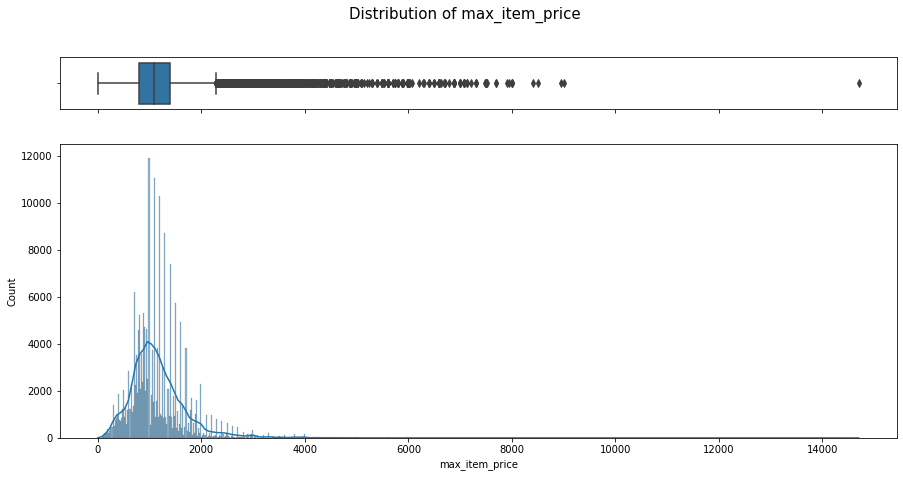

In [48]:
make_numerical_plots(df, 'max_item_price')

In [49]:
print(f'The values lying ouside of {quantile_boundaries(df["max_item_price"])} are considered outliers')
print(f'There are {outlier_count(df["max_item_price"])} outlier data points')

The values lying ouside of (-92.5, 2287.5) are considered outliers
There are 7729 outlier data points


__Findings:__
- The data looks normal. But there are lot outliers towards the right.

#### total_onshift_partners

In [51]:
df['total_onshift_partners'].describe()

count    181166.000000
mean         44.808093
std          34.526783
min          -4.000000
25%          17.000000
50%          37.000000
75%          65.000000
max         171.000000
Name: total_onshift_partners, dtype: float64

__Findings:__
- The number of delivery partners on duty at the time of order ranges from -4 to 171
- On an average, the number of delivery partners on duty is 45. Median number is 37

**Orders with negative count of total_onshift_partners**

In [52]:
df[df['total_onshift_partners'] < 0].sample(3)

,market_id,created_at,actual_delivery_time,store_id,store_primary_category,order_protocol,total_items,subtotal,num_distinct_items,min_item_price,max_item_price,total_onshift_partners,total_busy_partners,total_outstanding_orders
53702,1.0,2015-01-25 02:55:01,2015-01-25 03:41:37,c7502c55f8db540625b59d9a42638520,chinese,1.0,2,1803,2,818,1061,-1.0,4.0,7.0
33154,1.0,2015-02-02 22:27:36,2015-02-03 00:08:43,3b5e2c9be5002e87e0477099db5ff21b,american,1.0,2,2831,2,681,635,-1.0,13.0,16.0
138400,3.0,2015-01-24 20:10:09,2015-01-24 20:42:01,d877f2827995cb75c1cb8ea5cc55c0cd,other,3.0,1,1524,1,920,897,-2.0,3.0,-3.0


__Findings__
- The rows with negative value of total_onshift_partners do not make any sense. These order entries seems noisy. We will remove them.

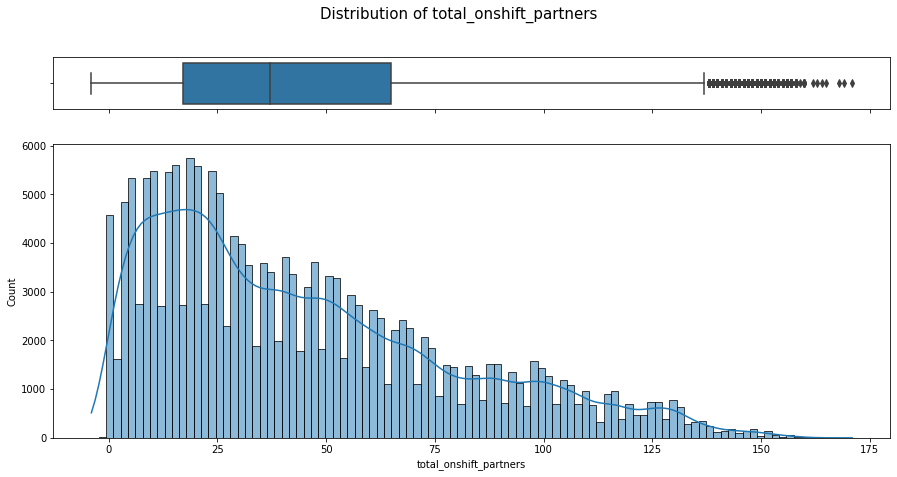

In [53]:
make_numerical_plots(df, 'total_onshift_partners')

In [54]:
print(f'The values lying ouside of {quantile_boundaries(df["total_onshift_partners"])} are considered outliers')
print(f'There are {outlier_count(df["total_onshift_partners"])} outlier data points')

The values lying ouside of (-55.0, 137.0) are considered outliers
There are 1502 outlier data points


__Findings:__
- The data is right-skewed. And also, there are many outliers.

#### total_busy_partners

In [55]:
df['total_busy_partners'].describe()

count    181166.000000
mean         41.739747
std          32.145733
min          -5.000000
25%          15.000000
50%          34.000000
75%          62.000000
max         154.000000
Name: total_busy_partners, dtype: float64

__Findings:__
- The number of delivery partners attending to other tasks during a order ranges from -5 to 154
- On an average, number of delivery partners attending to other tasks is 42. Median number is 34.

**Orders with negative count of total_busy_partners**

In [56]:
df[df['total_busy_partners'] < 0].sample(3)

,market_id,created_at,actual_delivery_time,store_id,store_primary_category,order_protocol,total_items,subtotal,num_distinct_items,min_item_price,max_item_price,total_onshift_partners,total_busy_partners,total_outstanding_orders
191717,3.0,2015-02-05 16:41:17,2015-02-05 17:30:26,c4536001673379765300886594b6b485,cafe,1.0,5,2338,4,266,942,8.0,-2.0,8.0
119242,3.0,2015-02-14 04:21:45,2015-02-14 05:40:08,6c19fec38725c11d5983f36ecf92f93a,seafood,4.0,4,1874,3,110,1378,-2.0,-1.0,11.0
59370,1.0,2015-01-30 19:55:28,2015-01-30 21:14:21,4915f20d2c36611cb101e95e5c34b4e7,sushi,5.0,5,1900,5,331,305,5.0,-3.0,3.0


__Findings__
- The rows with negative value of total_busy_partners do not make any sense. These order entries seems noisy. We will remove them.

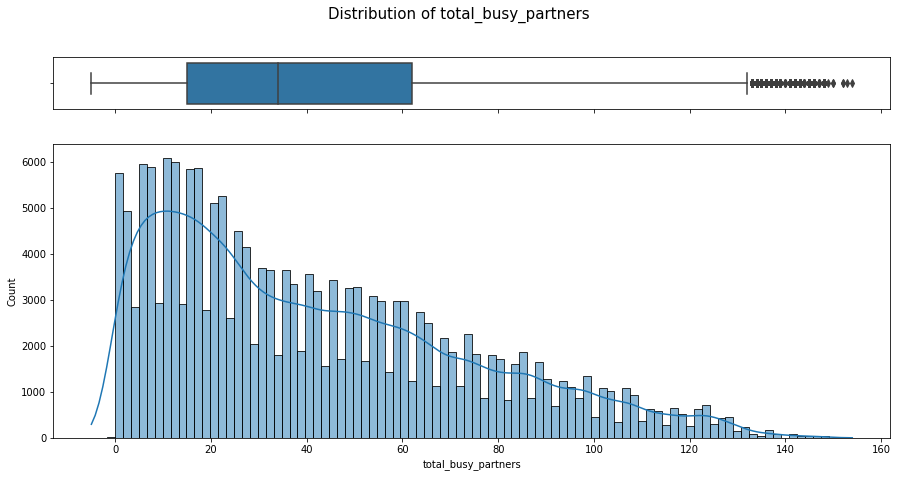

In [57]:
make_numerical_plots(df, 'total_busy_partners')

In [58]:
print(f'The values lying ouside of {quantile_boundaries(df["total_busy_partners"])} are considered outliers')
print(f'There are {outlier_count(df["total_busy_partners"])} outlier data points')

The values lying ouside of (-55.5, 132.5) are considered outliers
There are 606 outlier data points


__Findings:__
- The data is right-skewed. And also, there are many outliers.

#### total_outstanding_orders

In [59]:
df['total_outstanding_orders'].describe()

count    181166.000000
mean         58.050065
std          52.661830
min          -6.000000
25%          17.000000
50%          41.000000
75%          85.000000
max         285.000000
Name: total_outstanding_orders, dtype: float64

__Findings:__
- The total number of orders to be fulfilled at the moment ranges from -6 to 285 
- On an average, the number of pending orders is 58. Median number is 41.

**Orders with negative count of total_outstanding_orders**

In [60]:
df[df['total_outstanding_orders'] < 0].sample(3)

,market_id,created_at,actual_delivery_time,store_id,store_primary_category,order_protocol,total_items,subtotal,num_distinct_items,min_item_price,max_item_price,total_onshift_partners,total_busy_partners,total_outstanding_orders
98238,1.0,2015-01-23 18:47:42,2015-01-23 20:04:18,677e09724f0e2df9b6c000b75b5da10d,italian,3.0,6,7413,2,948,1399,1.0,0.0,-1.0
178086,2.0,2015-02-04 17:37:15,2015-02-04 18:16:06,6883966fd8f918a4aa29be29d2c386fb,breakfast,1.0,1,1457,1,1156,1355,10.0,11.0,-1.0
164549,1.0,2015-01-30 01:22:25,2015-01-30 02:57:35,d91d1b4d82419de8a614abce9cc0e6d4,vietnamese,1.0,4,3381,3,588,1013,6.0,3.0,-1.0


__Findings__
- The rows with negative value of total_outstanding_orders do not make any sense. These order entries seems noisy. We will remove them.

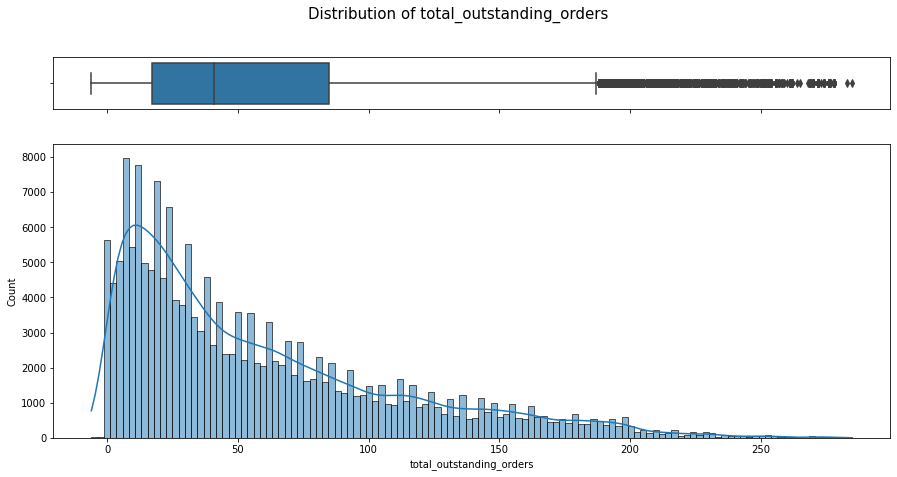

In [61]:
make_numerical_plots(df, 'total_outstanding_orders')

In [62]:
print(f'The values lying ouside of {quantile_boundaries(df["total_outstanding_orders"])} are considered outliers')
print(f'There are {outlier_count(df["total_outstanding_orders"])} outlier data points')

The values lying ouside of (-85.0, 187.0) are considered outliers
There are 5301 outlier data points


__Findings:__
- The data is right-skewed. And also, there are many outliers.

### Datetime Attributes

#### created_at

In [63]:
df['created_at'].describe()

count                  197428
unique                 180985
top       2015-02-11 19:50:43
freq                        6
first     2014-10-19 05:24:15
last      2015-02-18 06:00:44
Name: created_at, dtype: object

__Findings__
- We have informations for an order placed for 4 months, ie from "2014-10-19" to "2015-02-18".

#### actual_delivery_time

In [64]:
df['actual_delivery_time'].describe()

count                  197421
unique                 178110
top       2015-02-11 20:40:45
freq                        5
first     2015-01-21 15:58:11
last      2015-02-19 22:45:31
Name: actual_delivery_time, dtype: object

__Findings__
- We have informations for delivery fulfillments from "2015-01-21" to "2015-02-19"

### Object

#### store_id

In [65]:
df['store_id'].describe()

count                               197428
unique                                6743
top       d43ab110ab2489d6b9b2caa394bf920f
freq                                   937
Name: store_id, dtype: object

__Findings__
- There are 6743 unique stores listed with the company


In [66]:
gg = df.groupby(['store_id', 'store_primary_category']).apply(len).reset_index()
gg.rename(columns={0: 'num_of_orders'}, inplace=True)
gg.sort_values(by='num_of_orders', ascending=False, inplace=True)

In [67]:
gg.head(5)

,store_id,store_primary_category,num_of_orders
11825,d43ab110ab2489d6b9b2caa394bf920f,mexican,886
6559,757b505cfd34c64c85ca5b5690ee5293,american,815
13990,faacbcd5bf1d018912c116bf2783e9a1,mexican,776
11528,cfecdb276f634854f3ef915e2e980c31,mexican,723
4069,45c48cce2e2d7fbdea1afc51c7c6ad26,salad,666


In [68]:
gg.tail(5)

,store_id,store_primary_category,num_of_orders
6968,7d2a383e54274888b4b73b97e1aaa491,cafe,1
1025,11348e03e23b137d55d94464250a67a2,vietnamese,1
6972,7d2b92b6726c241134dae6cd3fb8c182,chinese,1
6973,7d2b92b6726c241134dae6cd3fb8c182,dessert,1
8052,90918ccd19a67747cadd8dbf8368c742,vietnamese,1


__Findings__
- Some of the stores receives orders in 3digit.
- Some of the stores merely receive a single order.

## Cleaning + Processing the data

We will do following things in this step:
1. We have various illegal entries in the data. We will remove them
2. We will take care of missing values
3. We will take care of outliers in the data


### 1 Illegal Entries

We will remove the following entries directly from data by applying filters.
- remove all the orders with "subtotal" less than 0
- remove all the rows with negative value of "min_item_price"
- remove all the rows with "max_item_price" less than or equal to 0
- remove all the rows with "total_onshift_partners", "total_busy_partners", and "total_outstanding_orders" less than 0

In [69]:
def clean_illegal_entries(df):
    return df[(df['subtotal'] > 0) & 
              (df['min_item_price'] >= 0) & 
              (df['max_item_price'] > 0) & 
              (df['total_onshift_partners'] >= 0) & 
              (df['total_busy_partners'] >= 0) &
              (df['total_outstanding_orders'] >= 0)]

cleaned_df = clean_illegal_entries(df)

In [70]:
print('Before:', df.shape)
print('After :', cleaned_df.shape)

Before: (197428, 14)
After : (180901, 14)


### 2 Handle Missing Values

In [71]:
cleaned_df.isna().sum() / cleaned_df.shape[0] * 100

market_id                   0.508013
created_at                  0.000000
actual_delivery_time        0.003870
store_id                    0.000000
store_primary_category      2.327240
order_protocol              0.506354
total_items                 0.000000
subtotal                    0.000000
num_distinct_items          0.000000
min_item_price              0.000000
max_item_price              0.000000
total_onshift_partners      0.000000
total_busy_partners         0.000000
total_outstanding_orders    0.000000
dtype: float64

__Findings__
- "market_id", "actual_delivery_time", and "order_protocol" have roughly 0.5% of missing data. As these numbers are very low, we can safely remove these rows without much loss in information.

In [72]:
print('Shape before removing missing rows:', cleaned_df.shape)
cleaned_df.dropna(subset=["market_id", "actual_delivery_time", "order_protocol"], inplace=True)
print('Shape after removing missing rows:', cleaned_df.shape)

Shape before removing missing rows: (180901, 14)
Shape after removing missing rows: (179512, 14)


__Findings__
- 1389 rows got removed

> **Impute "store_primary_category"**

For the missing values in "store_primary_category", we will first find the "market_id" it belongs to, then use the modal "store_primary_category" value to impute them.

In [73]:
def impute_missing_val(dd, market_id, store_primary_category):
    if pd.isna(store_primary_category):
        return dd[market_id]
    else:
        return store_primary_category

In [74]:
impute_val = cleaned_df.groupby('market_id').agg({'store_primary_category': pd.Series.mode}).reset_index()
impute_val

,market_id,store_primary_category
0,1.0,american
1,2.0,mexican
2,3.0,american
3,4.0,pizza
4,5.0,american
5,6.0,pizza


In [75]:
impute_dict = dict(zip(impute_val['market_id'], impute_val['store_primary_category']))
print(impute_dict)

{1.0: 'american', 2.0: 'mexican', 3.0: 'american', 4.0: 'pizza', 5.0: 'american', 6.0: 'pizza'}


In [76]:
cleaned_df['store_primary_category'] = cleaned_df[['market_id', 'store_primary_category']].apply(lambda x: impute_missing_val(impute_dict, *x), axis=1)

In [77]:
cleaned_df.isna().sum()

market_id                   0
created_at                  0
actual_delivery_time        0
store_id                    0
store_primary_category      0
order_protocol              0
total_items                 0
subtotal                    0
num_distinct_items          0
min_item_price              0
max_item_price              0
total_onshift_partners      0
total_busy_partners         0
total_outstanding_orders    0
dtype: int64

__Findings__
- We have treated all the missing values

In [78]:
cleaned_df.reset_index(drop=True, inplace=True)

### 3 Feature Engineering:

#### time_taken

- We can take the difference between "created_at" and "actual_delivery_time" to find the total time taken to fulfill an order.

In [79]:
%%time
cleaned_df['time_taken'] = ((cleaned_df['actual_delivery_time'] - cleaned_df['created_at']) / pd.Timedelta(minutes=1)).astype('int')

CPU times: user 4.7 ms, sys: 0 ns, total: 4.7 ms
Wall time: 4.71 ms


In [80]:
cleaned_df['time_taken'].describe()

count    179512.000000
mean         47.280533
std          27.527075
min           1.000000
25%          35.000000
50%          44.000000
75%          56.000000
max        6231.000000
Name: time_taken, dtype: float64

__Findings:__
- Total time taken to fulfill and order ranges from 1min to 6231min.
- The average time taken to fulfill an order is 47min. The median value is 44min.

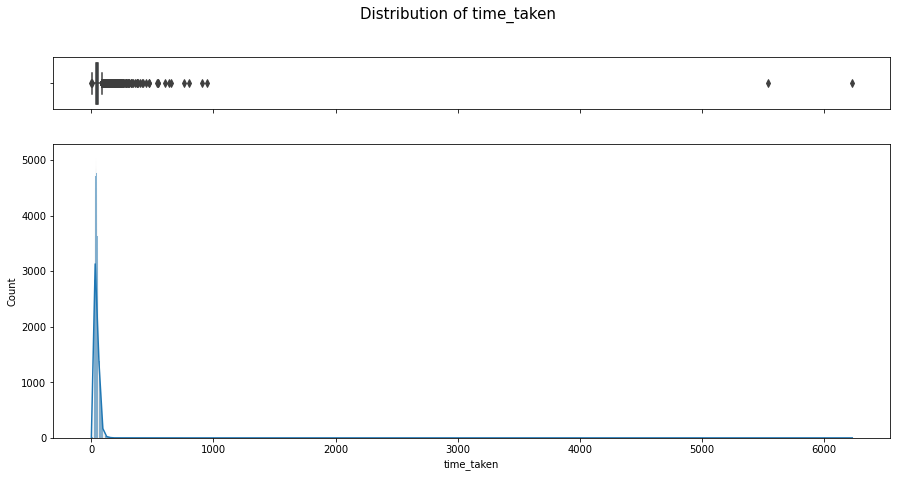

In [81]:
make_numerical_plots(cleaned_df, 'time_taken')

In [82]:
print(f'The values lying ouside of {quantile_boundaries(cleaned_df["time_taken"])} are considered outliers')
print(f'There are {outlier_count(cleaned_df["time_taken"])} outlier data points')

The values lying ouside of (3.5, 87.5) are considered outliers
There are 5789 outlier data points


__Findings:__
- There are lot of outliers in the distribution.

#### order_day_of_week

- We will extract the day_of_week information from the timestamp at which an order is placed (created_at). This will help us get an idea of demands as per day_of_week.

The encoding of day_of_week informations are as follows: 
- 0 - Monday
- 1 - Tuesday
- ...
- 6-Sunday

In [83]:
cleaned_df['order_day_of_week'] = cleaned_df['created_at'].dt.day_of_week

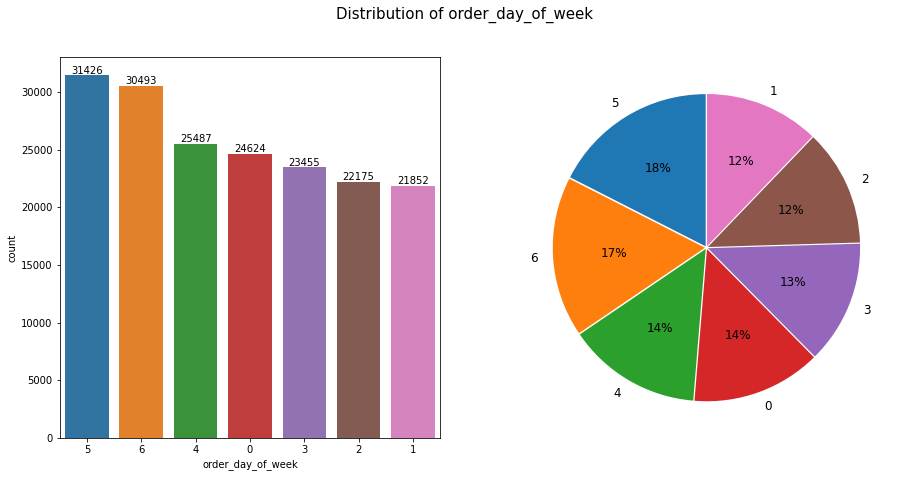

In [84]:
make_categorical_plots(cleaned_df, 'order_day_of_week')

__Findings__
- Highest orders are placed on Weekends (Saturday, and Sunday).
- The number of orders on Weekdays (Monday to Friday) are comparatively lesser.

#### order_hour

- We will extract the hour information from the timestamp at which an order is placed (created_at). This will help us get an idea of demands as per hour of the day.

The encoding of month informations are as follows: 
- 0 - Midnight to 0:59am
- 1 - 1am to 1:59am
- ...
- 23 - 11pm to 11:59pm

In [85]:
cleaned_df['order_hour'] = cleaned_df['created_at'].dt.hour

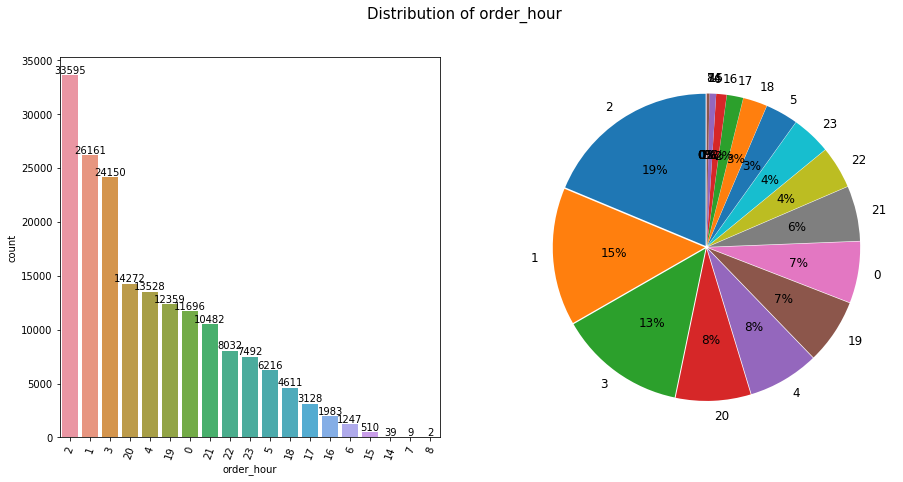

In [86]:
make_categorical_plots(cleaned_df, 'order_hour')

__Findings__
- Highest orders are placed during 1am to 4am
- Least orders are placed in the morning (6am to 9am) and afternoon (2pm to 6pm)

### 4 Preparing data for modelling

In [87]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import IsolationForest

In [88]:
num_cols = ['total_items', 'subtotal', 'num_distinct_items', 'min_item_price', 'max_item_price', \
            'total_onshift_partners', 'total_busy_partners', 'total_outstanding_orders', 'order_day_of_week', 'order_hour']
cat_cols = ['market_id', 'store_primary_category', 'order_protocol']
target   = ['time_taken']

In [89]:
x_train, x_test, y_train, y_test = train_test_split(cleaned_df[num_cols+cat_cols], cleaned_df['time_taken'], test_size=0.25, random_state=42)

**ENCODING CATEGORICALS** - Target Encoding

In [90]:
for col in cat_cols:
    dd = x_train[col].value_counts(normalize=True).to_dict()
    x_train[col] = x_train[col].map(dd)

x_train.head(3)

,total_items,subtotal,num_distinct_items,min_item_price,max_item_price,total_onshift_partners,total_busy_partners,total_outstanding_orders,order_day_of_week,order_hour,market_id,store_primary_category,order_protocol
60206,3,2459,3,676,1236,85.0,88.0,131.0,4,3,0.120423,0.049742,0.266121
21944,2,2190,2,795,1395,15.0,15.0,13.0,3,1,0.209843,0.110826,0.280308
45700,3,2675,3,350,1325,8.0,9.0,11.0,0,3,0.209843,0.000772,0.118796


### 5 Removing Outliers

There are many outliers in most of the columns. Now, there are different ways to remove the outliers, such as IQR, Ransac, etc.

As the features are dependent on each other, what seems to be an outlier in an PDF plot, might not be an outlier in an overall scenario. Hence, we will use Model based method like IsolationForest to remove outliers.

**ISOLATION FOREST**

In [91]:
contamination = 0.04

if_model = IsolationForest(n_estimators=200, contamination=contamination, random_state=42)
x_train['pred'] = if_model.fit_predict(x_train)

In [92]:
idxs = x_train[x_train['pred'] == -1].index

__FINAL DATAFRAMES__

In [93]:
x_train, x_test = train_test_split(cleaned_df[num_cols+cat_cols+target], test_size=0.25, random_state=42)


x_final = x_train.loc[~ x_train.index.isin(idxs)]

print('Rows Before Outlier Removal: ', x_train.shape[0])
print('Rows Afer   Outlier Removal: ', x_final.shape[0])

Rows Before Outlier Removal:  134634
Rows Afer   Outlier Removal:  129248


### Summary:

- We cleaned rows with illegal values
- We treated missing values
- We did some feature engineering
- We removed outliers
- We have a cleaned dataset

## Bivariate Analysis

The dependent variable for our problem statement is "time_taken", and the remaing attribues are the independent variable. We will try to understand the impact of independent variables on the dependent variable.

### Pairplot, Correlation

<Figure size 1080x504 with 0 Axes>

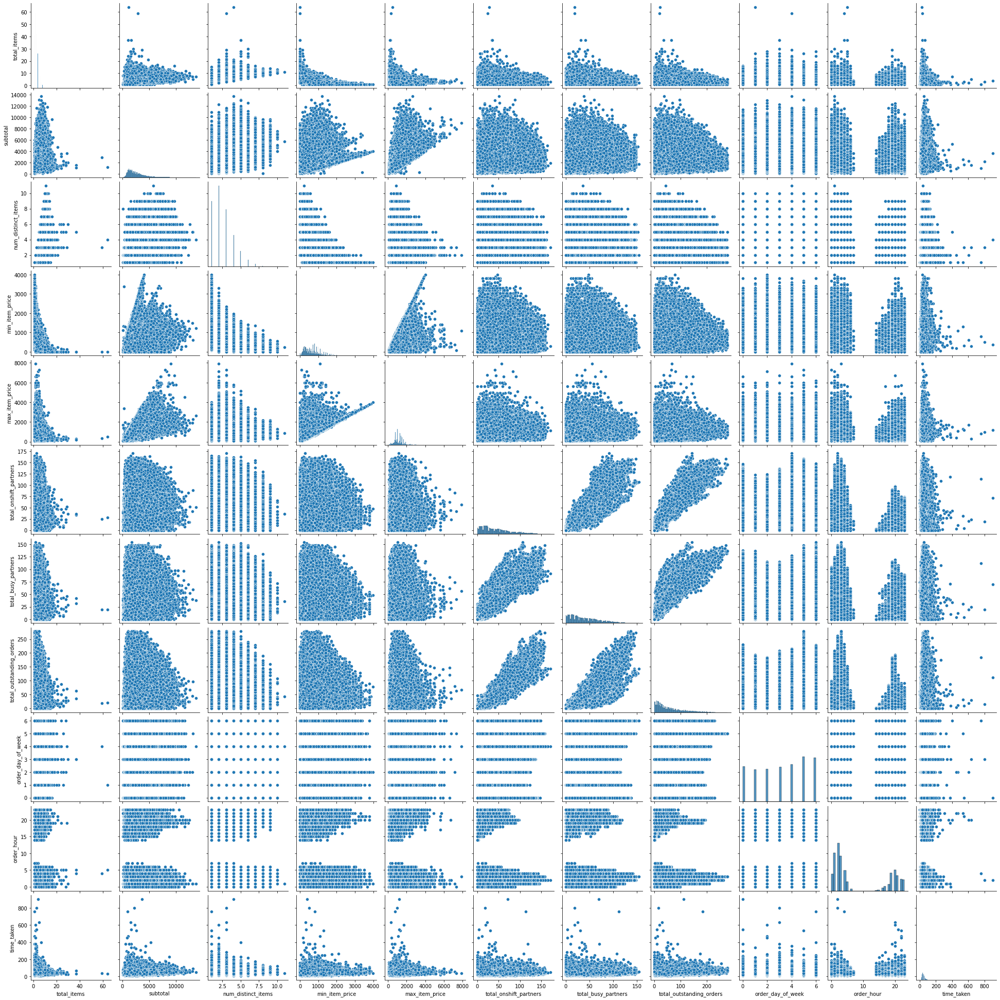

In [94]:
plt.figure(figsize=(15,7))
sns.pairplot(x_final[num_cols + target])
plt.show()

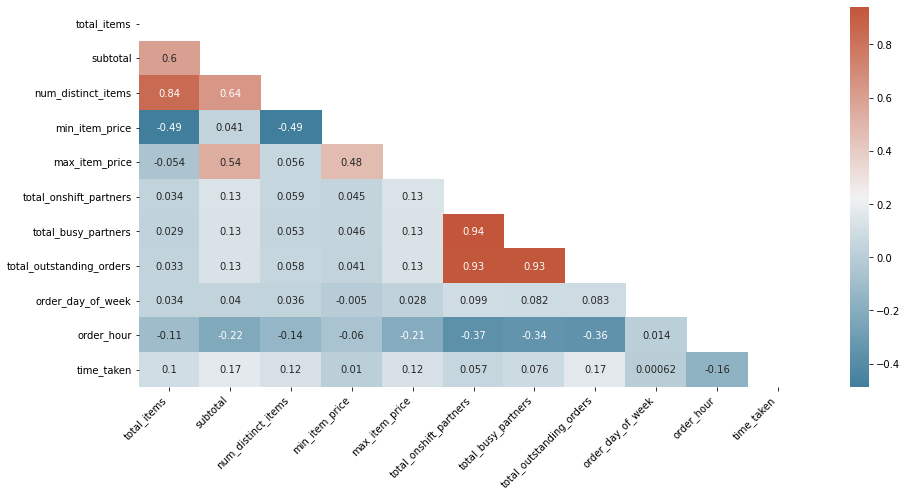

In [95]:
# Correlation between different variables
corr = x_final[num_cols + target].corr()

# Set up the matplotlib plot configuration
f, ax = plt.subplots(figsize=(15, 7))

# Generate a mask for upper traingle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Configure a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap
sns.heatmap(corr, annot=True, mask = mask, cmap=cmap)

ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
)
plt.show()

__Findings:__
- There is no any strong correlation between dependent and the independent variables.
- There is some strong correlation between some of the independent variables pairs.


There is high +ve correlation among the following pairs:
- num_distinct_items and total_items (0.84)
- num_distinct_items and subtotal (0.64)
- total_busy_partners and total_onshift_partners (0.94)
- total_outstanding_orders and total_onshift_partners (0.93)
- total_outstanding_orders and total_busy_partners (0.93)


There is high -ve correlation among the following pairs:
- min_item_price and total_items (-0.49)
- num_distinct_items and min_item_price (-0.49)


### Target

In [340]:
x_final['time_taken'].describe()

count    129248.00000
mean         46.74966
std          19.07413
min           3.00000
25%          34.00000
50%          43.00000
75%          55.00000
max         907.00000
Name: time_taken, dtype: float64

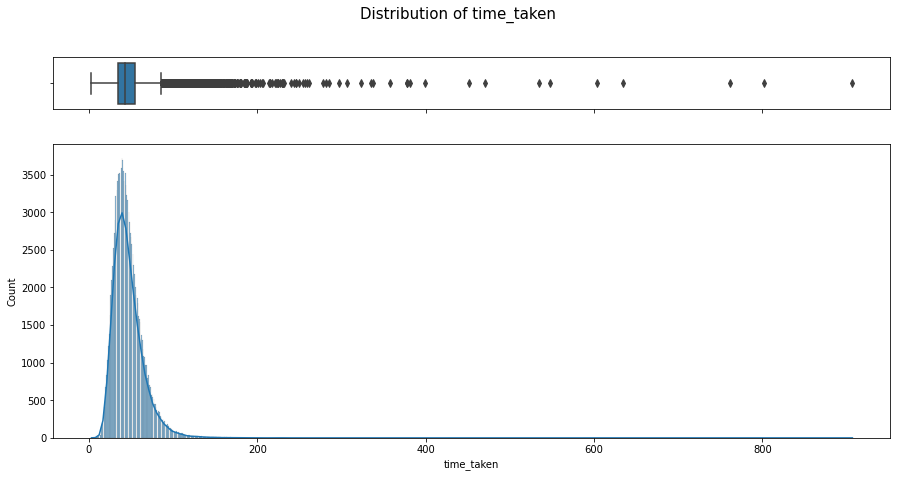

In [339]:
make_numerical_plots(x_final, 'time_taken')

__Findings__
- The average time for an order fulfillment is 47mins, and median time us 43 mins.

### Categoricals

In [96]:
import plotly.figure_factory as ff
import numpy as np

def plot_distributions(df, col):
    hist_data    = []
    group_labels = []

    # Group data together
    for val in df[col].unique():
        hist_data.append(df[df[col] == val]['time_taken'])
        group_labels.append(f'{col}_{val}')

    # Create distplot with custom bin_size
    fig = ff.create_distplot(hist_data, group_labels, bin_size=.2)
    fig.update_layout(title_text=f'Distributions of Time Taken for different {col}')
    fig.show()

#### Effect of market_id on time_taken

In [97]:
col    = 'market_id'
plot_distributions(x_final, col)

__Findings__:

- The distribution is similar for the markets 1, 2, 3, 4, and 5
- The variance is lowest in market 6. Also, the time taken for order fulfillment is lowest for this market
- There are some large values for markets 1, 2, and 3

#### Effect of order_protocol on time_taken

In [98]:
col    = 'order_protocol'
plot_distributions(x_final, col)

In [ ]:
cleaned_df.groupby(target)[col].mean()

target
0    60825.351137
1    53661.070108
Name: Income, dtype: float64

__Findings__:

- The distribution is similar for the order_protocols 1, 2, 3, 4, 5 and 6
- The variance is lowest in market 7. Also, the time taken is lowest for orders from order protocol channel 7
- There are some large values for order protocols 6, 2, and 3

#### Effect of store_primary_category on churn

In [99]:
med_time = x_final.groupby('store_primary_category')['time_taken'].median().reset_index()
med_time.sort_values(by='time_taken', ascending=False, inplace=True)
med_time

,store_primary_category,time_taken
42,lebanese,55.0
8,brazilian,52.0
55,russian,51.0
16,caribbean,51.0
13,burmese,50.0
...,...,...
61,soup,39.0
59,singaporean,38.0
21,comfort-food,37.0
20,chocolate,34.0


__Findings__:

- "lebanese", "brazilian", "russian", "caribbean", "burmese" restaurents takes the most amount of time for delivery
- "soup", "singaporean", "comfort-food", "chocolate", "kosher" restaurents takes the least amount of time for delivery

# Data Preparation + Modelling

### Baseline Model - Random Forest 

- We will not do any hyperparameter tuning for this baseline model. Hence, there is no need for cross validation. We will just fit the model on train data, and evaluate on test data.

> **TRAIN - TEST SPLIT**

We already have the train test splits from above steps as:
- train - x_final
- test  - x_test

In [100]:
x_tr_rf = x_final.copy()
x_te_rf = x_test.copy()

> **ENCODING**

In [101]:
from sklearn.preprocessing import StandardScaler, PowerTransformer
from sklearn.compose import TransformedTargetRegressor, ColumnTransformer
from sklearn.pipeline import FeatureUnion, Pipeline, make_pipeline
from sklearn.base import BaseEstimator, TransformerMixin

In [121]:
class Target_Encoder(BaseEstimator, TransformerMixin):

  def __init__(self):
      self.cols = ['market_id', 'store_primary_category', 'order_protocol']
      self.dd = {}

  def fit(self, X, y = None):
    for col in self.cols:
        self.dd[col] = X[col].value_counts(normalize=True).to_dict()
    return self

  def transform(self, X, y = None):
    X_ = X.copy() # creating a copy to avoid changes to original dataset
    for col in self.cols:
        X_[col] = X_[col].map(self.dd[col])
        X_.fillna(0.5, inplace=True)
    return X_

> **NUMERICALS**

Scaling is not a requirement for tree-based models.

> **MODELLING**

In [203]:
print('-'*10, 'Shapes', '-'*10)
print(f'Train data shape: {x_tr_rf.shape}')
print(f'Test  data shape: {x_te_rf.shape}')

---------- Shapes ----------
Train data shape: (129248, 14)
Test  data shape: (44878, 14)


In [104]:
num_cols = ['total_items', 'subtotal', 'num_distinct_items', 'min_item_price', 'max_item_price', \
            'total_onshift_partners', 'total_busy_partners', 'total_outstanding_orders', 'order_day_of_week', 'order_hour']
cat_cols = ['market_id', 'store_primary_category', 'order_protocol']
target   = ['time_taken']

In [105]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import (
    mean_squared_error as MSE,
    mean_absolute_error as MAE
)

In [127]:
te  = Target_Encoder()
rfr = RandomForestRegressor(n_jobs = -1, random_state = 10)

param_grid = {
    'random_forest__n_estimators' : [10, 50, 100, 150, 200], 
    'random_forest__max_depth' : [2, 3, 4, 5, 6, 7, 8, 9, 10],
    'random_forest__max_samples': [0.6, 0.7, 0.8, 0.9, 1]
}

pipe_rfr = Pipeline([
    ('target_encoder', te),
    ('random_forest' , rfr)
    ])

clf = RandomizedSearchCV(pipe_rfr, param_grid, cv=5, scoring='neg_mean_squared_error', verbose=1)
clf.fit(x_tr_rf[cat_cols+num_cols], x_tr_rf['time_taken'])

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('target_encoder',
                                              Target_Encoder()),
                                             ('random_forest',
                                              RandomForestRegressor(n_jobs=-1,
                                                                    random_state=10))]),
                   param_distributions={'random_forest__max_depth': [2, 3, 4, 5,
                                                                     6, 7, 8, 9,
                                                                     10],
                                        'random_forest__max_samples': [0.6, 0.7,
                                                                       0.8, 0.9,
                                                                       1],
                                        'random_forest__n_estimators': [10, 50,
                                                              

In [133]:
clf.best_params_

{'random_forest__n_estimators': 50,
 'random_forest__max_samples': 0.9,
 'random_forest__max_depth': 10}

In [341]:
clf.best_score_

-287.46788590639596

> **Training the model with the best classifier**

In [129]:
randf = clf.best_estimator_
randf.fit(x_tr_rf[cat_cols+num_cols], x_tr_rf['time_taken'])

Pipeline(steps=[('target_encoder', Target_Encoder()),
                ('random_forest',
                 RandomForestRegressor(max_depth=10, max_samples=0.9,
                                       n_estimators=50, n_jobs=-1,
                                       random_state=10))])

> **FEATURE IMPORTANCES**

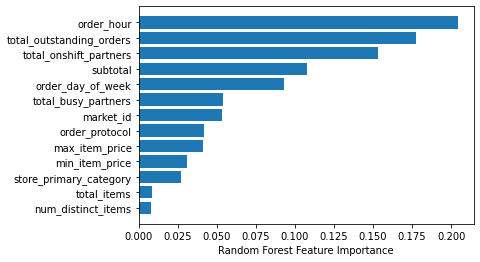

In [352]:
sorted_idx = randf[1].feature_importances_.argsort()
plt.barh(np.array(cat_cols+num_cols)[sorted_idx], randf[1].feature_importances_[sorted_idx])
plt.xlabel("Random Forest Feature Importance")
plt.show()

__Finding__
- order_hour, total_outstanding_orders, total_onshift_partners are the top 3 most important features.

> __MODEL REPORT__

In [131]:
pred_train = randf.predict(x_tr_rf[cat_cols+num_cols])
pred_test  = randf.predict(x_te_rf[cat_cols+num_cols])

In [132]:
print("TRAIN MSE", MSE(x_tr_rf['time_taken'], pred_train))
print("TEST  MSE", MSE(x_te_rf['time_taken'], pred_test))

print('*'*30)

print("TRAIN RMSE", np.sqrt(MSE(x_tr_rf['time_taken'], pred_train)))
print("TEST  RMSE", np.sqrt(MSE(x_te_rf['time_taken'], pred_test)))

print('*'*30)

print("TRAIN MAE", MAE(x_tr_rf['time_taken'], pred_train))
print("TEST  MAE", MAE(x_te_rf['time_taken'], pred_test))

TRAIN MSE 249.77584175935795
TEST  MSE 1831.962068403422
******************************
TRAIN RMSE 15.80429820521487
TEST  RMSE 42.8014260089944
******************************
TRAIN MAE 11.200929705759517
TEST  MAE 11.960823991516886


## NN Regression

In [310]:
import tensorflow as tf
from tensorflow.keras import Input, Model
from tensorflow.keras.layers import Embedding, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import RMSprop, Adam, Adagrad
import tensorflow.keras.backend as K
from tensorflow.keras.metrics import (
    mean_absolute_percentage_error as MAPE,
    mean_squared_error as MSE, 
    RootMeanSquaredError as RMSE
)
from tensorflow.keras.callbacks import ReduceLROnPlateau, Callback

# https://gist.github.com/danicrg/ab3bc7c330ce152bcf643231de4820e9#file-plot_learning_callback-py
import numpy as np 
from tensorflow import keras
from matplotlib import pyplot as plt
from tensorflow.keras.initializers import HeNormal, GlorotNormal
from IPython.display import clear_output

In [155]:
class PlotLearning(Callback):
    """
    Callback to plot the learning curves of the model during training.
    """
    def on_train_begin(self, logs={}):
        self.metrics = {}
        for metric in logs:
            self.metrics[metric] = []
            

    def on_epoch_end(self, epoch, logs={}):
        # Storing metrics
        for metric in logs:
            if metric in self.metrics:
                self.metrics[metric].append(logs.get(metric))
            else:
                self.metrics[metric] = [logs.get(metric)]
        
        # Plotting
        metrics = [x for x in logs if 'val' not in x]
        
        f, axs = plt.subplots(1, len(metrics), figsize=(15,5))
        clear_output(wait=True)

        for i, metric in enumerate(metrics):
            axs[i].plot(range(1, epoch + 2), 
                        self.metrics[metric], 
                        label=metric)
            if logs['val_' + metric]:
                axs[i].plot(range(1, epoch + 2), 
                            self.metrics['val_' + metric], 
                            label='val_' + metric)
                
            axs[i].legend()
            axs[i].grid()

        plt.tight_layout()
        plt.show()

> **TRAIN - TEST SPLIT**


In [288]:
train_x = x_final[num_cols + cat_cols].copy()
train_y = x_final['time_taken'].copy()

test_x  = x_test[num_cols + cat_cols].copy()
test_y  = x_test['time_taken'].copy()

> **SCALING** - Standard Scaler

In [ ]:
for col in num_cols:
    sc = StandardScaler()
    sc.fit(train_x[col].values.reshape(-1, 1))
    train_x[col] = sc.transform(train_x[col].values.reshape(-1, 1))
    test_x[col]  = sc.transform(test_x[col].values.reshape(-1, 1))


> **ENCODING** - OHE

In [180]:
train_x_ohe = pd.get_dummies(train_x, columns=cat_cols, drop_first=True)
test_x_ohe = pd.get_dummies(test_x, columns=cat_cols, drop_first=True)

In [183]:
print(f'Train Shape', train_x_ohe.shape)
print(f'Test  Shape', test_x_ohe.shape)

Train Shape (129248, 92)
Test  Shape (44878, 92)


#### MODEL 1

> **MODEL ARCHITECTURE**

In [265]:
# some model parameters
input_dim = train_x_ohe.shape[1] #13
output_dim = 1
lr         = 0.01

# training parameters
batch_size = 256
nb_epoch   = 50

In [266]:
# model
K.clear_session()

input = Input(shape=(input_dim,))

x = Dense(128, activation='relu', kernel_initializer=HeNormal())(input)
x = Dense(64, activation='relu', kernel_initializer=HeNormal())(x)
x = Dense(16, activation='relu', kernel_initializer=HeNormal())(x)

output = Dense(output_dim)(x)

# Compile and Fit
model1 = Model(input, output)
model1.compile(loss='mse', metrics=[RMSE('rmse'), 'mae'], optimizer=Adam(learning_rate=lr))

In [267]:
model1.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 92)]              0         
                                                                 
 dense (Dense)               (None, 128)               11904     
                                                                 
 dense_1 (Dense)             (None, 64)                8256      
                                                                 
 dense_2 (Dense)             (None, 16)                1040      
                                                                 
 dense_3 (Dense)             (None, 1)                 17        
                                                                 
Total params: 21,217
Trainable params: 21,217
Non-trainable params: 0
_________________________________________________________________


In [268]:
plot_learning = PlotLearning()
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=0.001)
callbacks = [plot_learning, reduce_lr]

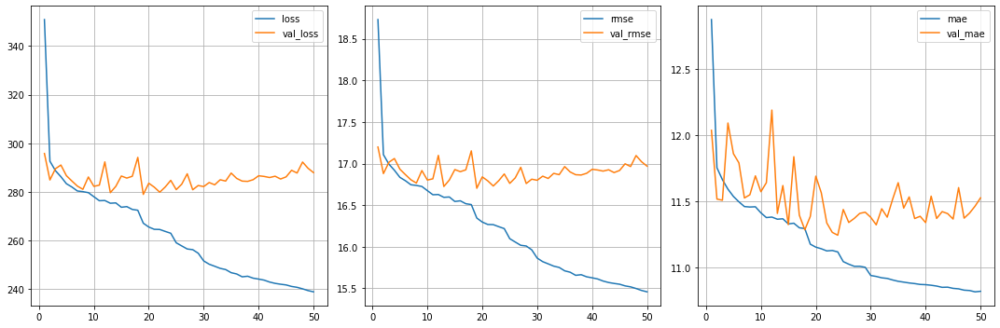

404/404 [==============================] - 2s 5ms/step - loss: 238.9447 - rmse: 15.4578 - mae: 10.8224 - val_loss: 287.9299 - val_rmse: 16.9685 - val_mae: 11.5273 - lr: 0.0010


In [269]:
history = model1.fit(
    train_x_ohe, train_y,
    batch_size=batch_size,
    epochs=nb_epoch,
    validation_split=0.2,
    callbacks=callbacks
)

**Results on Test Data**

In [270]:
mse_loss1, rmse_score1, mae_score1 = model1.evaluate(
    x=test_x_ohe,
    y=test_y,
    batch_size=batch_size
)

176/176 [==============================] - 0s 2ms/step - loss: 1809.6772 - rmse: 42.5403 - mae: 12.4449


In [271]:
print(f'Loss on Test Data --> {np.round(mse_loss1, 3)}')
print(f'RMSE on Test Data --> {np.round(rmse_score1, 3)}')
print(f'MAPE on Test Data --> {np.round(mae_score1, 3)}')

Loss on Test Data --> 1809.677
RMSE on Test Data --> 42.54
MAPE on Test Data --> 12.445


__Comments__
- The model is overfitting a lot

#### MODEL 2

> **MODEL ARCHITECTURE**

In [318]:
# some model parameters
input_dim = train_x_ohe.shape[1] #13
output_dim = 1

# training parameters
batch_size = 256
nb_epoch  = 50

In [319]:
# model
K.clear_session()

input = Input(shape=(input_dim,))
x = Dense(128, activation='relu', kernel_initializer=HeNormal())(input)

x = Dense(64, activation='relu', kernel_initializer=HeNormal())(x)

x = Dense(32, activation='relu', kernel_initializer=HeNormal())(x)
x = BatchNormalization()(x)
x = Dropout(0.4)(x)

x = Dense(16, activation='relu', kernel_initializer=HeNormal())(x)
x = BatchNormalization()(x)
x = Dropout(0.4)(x)

output = Dense(output_dim)(x)

# Compile and Fit
model2 = Model(input, output)
model2.compile(loss='mse', metrics=[RMSE('rmse'), 'mae'], optimizer=RMSprop())

In [320]:
model2.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 92)]              0         
                                                                 
 dense (Dense)               (None, 128)               11904     
                                                                 
 dense_1 (Dense)             (None, 64)                8256      
                                                                 
 dense_2 (Dense)             (None, 32)                2080      
                                                                 
 batch_normalization (BatchN  (None, 32)               128       
 ormalization)                                                   
                                                                 
 dropout (Dropout)           (None, 32)                0         
                                                             

In [321]:
plot_learning = PlotLearning()
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=0.001)
callbacks = [plot_learning, reduce_lr]

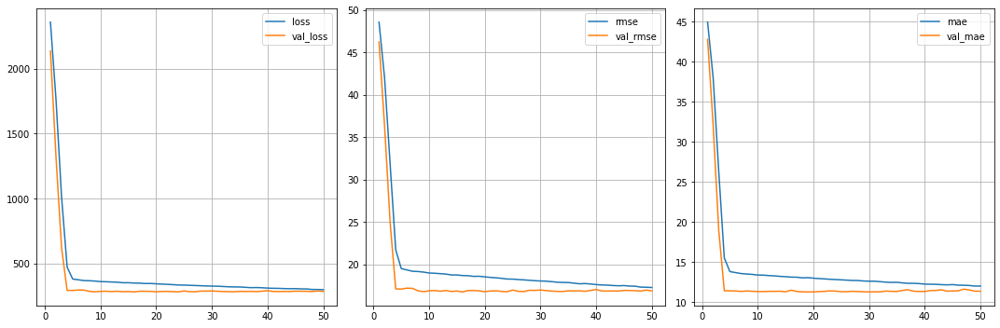

404/404 [==============================] - 3s 7ms/step - loss: 297.7436 - rmse: 17.2552 - mae: 11.9733 - val_loss: 284.1282 - val_rmse: 16.8561 - val_mae: 11.3199 - lr: 0.0010


In [322]:
history = model2.fit(
    train_x_ohe, train_y,
    batch_size=batch_size,
    epochs=nb_epoch,
    validation_split=0.2,
    callbacks=callbacks
)

**Results on Test Data**

In [354]:
mse_loss2, rmse_score2, mae_score2 = model2.evaluate(
    x=test_x_ohe,
    y=test_y,
    batch_size=batch_size
)

176/176 [==============================] - 0s 3ms/step - loss: 1869.81 - rmse: 43.241 - mae: 12.538


In [278]:
print(f'Loss on Test Data --> {np.round(mse_loss2, 3)}')
print(f'RMSE on Test Data --> {np.round(rmse_score2, 3)}')
print(f'MAPE on Test Data --> {np.round(mae_score2, 3)}')

Loss on Test Data --> 1869.81
RMSE on Test Data --> 43.241
MAPE on Test Data --> 12.538


__Comments__
- Model 2 generalizes better than Model 1.

#### MODEL 3

> **MODEL ARCHITECTURE**

In [325]:
# some model parameters
input_dim = train_x_ohe.shape[1] #13
output_dim = 1

# training parameters
batch_size = 256
nb_epoch   = 50

In [333]:
# model
K.clear_session()

input = Input(shape=(input_dim,))
x = Dense(256, activation='tanh', kernel_initializer=GlorotNormal())(input)

x = Dense(128, activation='tanh', kernel_initializer=GlorotNormal())(x)

x = Dense(64, activation='tanh', kernel_initializer=GlorotNormal())(x)
x = BatchNormalization()(x)
x = Dropout(0.4)(x)

x = Dense(32, activation='tanh', kernel_initializer=GlorotNormal())(x)
x = BatchNormalization()(x)
x = Dropout(0.4)(x)

x = Dense(8, activation='tanh', kernel_initializer=GlorotNormal())(x)

output = Dense(output_dim)(x)

# Compile and Fit
model3 = Model(input, output)
model3.compile(loss='mse', metrics=[RMSE('rmse'), 'mae'], optimizer=Adam())

In [334]:
model3.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 92)]              0         
                                                                 
 dense (Dense)               (None, 256)               23808     
                                                                 
 dense_1 (Dense)             (None, 128)               32896     
                                                                 
 dense_2 (Dense)             (None, 64)                8256      
                                                                 
 batch_normalization (BatchN  (None, 64)               256       
 ormalization)                                                   
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                             

In [335]:
plot_learning = PlotLearning()
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=0.001)
callbacks = [plot_learning, reduce_lr]

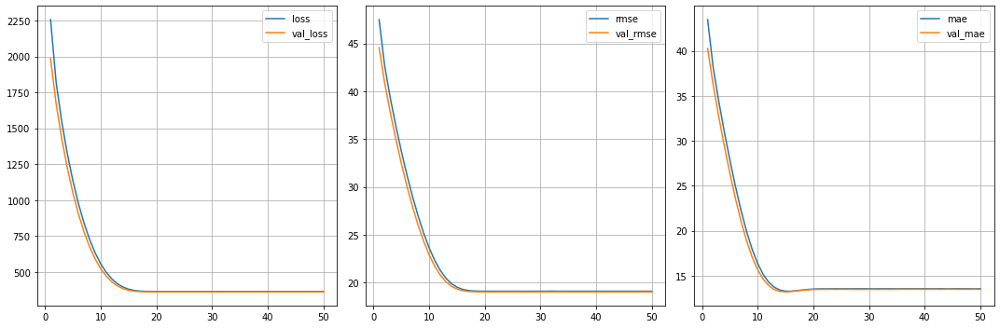

404/404 [==============================] - 3s 8ms/step - loss: 364.3324 - rmse: 19.0875 - mae: 13.5455 - val_loss: 361.7987 - val_rmse: 19.0210 - val_mae: 13.4725 - lr: 0.0010


In [336]:
history = model3.fit(
    train_x_ohe, train_y,
    batch_size=batch_size,
    epochs=nb_epoch,
    validation_split=0.2,
    callbacks=callbacks
)

**Results on Test Data**

In [353]:
mse_loss3, rmse_score3, mae_score3 = model3.evaluate(
    x=test_x_ohe,
    y=test_y,
    batch_size=batch_size
)

176/176 [==============================] - 1s 3ms/step - loss: 1852.907 - rmse: 43.045 - mae: 12.278


In [289]:
print(f'Loss on Test Data --> {np.round(mse_loss3, 3)}')
print(f'RMSE on Test Data --> {np.round(rmse_score3, 3)}')
print(f'MAPE on Test Data --> {np.round(mae_score3, 3)}')

Loss on Test Data --> 1852.907
RMSE on Test Data --> 43.045
MAPE on Test Data --> 12.278


## Comparision of Results

In [290]:
def get_color(x):
    mn, mx = min(x), max(x)
    res = []
    for i in x:
        if i == mn:
            res.append(f"\033[1;32m {str(i)} \033[0m")
        elif i == mx:
            res.append(f"\033[1;31m {str(i)} \033[0m")
        else:
            res.append(i)
    return res

In [294]:
scores = ["MSE", "RMSE", "MAE"]
r_f    = [1831.962, 42.801, 11.961]  
nn_1   = [mse_loss1, rmse_score1, mae_score1]
nn_2   = [mse_loss2, rmse_score2, mae_score2]
nn_3   = [mse_loss3, rmse_score3, mae_score3]

In [296]:
x = PrettyTable(["Score", "RandomForest", "NN - 1", "NN - 2", "NN - 3"]) 
for s, rf, n1, n2, n3 in zip(scores, r_f, nn_1, nn_2, nn_3):
    x.add_row([s] + get_color([rf, n1, n2, n3]))
    x.add_row([' ', ' ', ' ', ' ', ' '])
print(x)

+-------+--------------+---------------------+----------------------+--------------------+
| Score | RandomForest |        NN - 1       |        NN - 2        |       NN - 3       |
+-------+--------------+---------------------+----------------------+--------------------+
|  MSE  |   1831.962   |   1809.67724609375  |  1869.8101806640625  |  1852.9072265625   |
|       |              |                     |                      |                    |
|  RMSE |    42.801    |  42.54030227661133  |  43.241302490234375  | 43.045406341552734 |
|       |              |                     |                      |                    |
|  MAE  |    11.961    |  12.444920539855957 |  12.537997245788574  | 12.278366088867188 |
|       |              |                     |                      |                    |
+-------+--------------+---------------------+----------------------+--------------------+


**NB**
- Green --> Best Score
- Red --> Worst Score

__Summary__
- We built 3 NN models using different combinations of: number of layers, optimizers, weight initializers, etc.
- The MSE is lowest for the NN Model 1
- The RMSE is lowest for the NN Model 1
- The MAE is lowest for the RandomForest Model
- RandomForest has similar performance as compared to the MLP models.